# **Jalila - 1201611**

In [75]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler

In [76]:
# Read the file Electric_Vehicle_Population_Data.csv and create a dataFrame
eV_DataFrame = pd.read_csv('Electric_Vehicle_Population_Data.csv')

In [77]:
df = pd.DataFrame(eV_DataFrame)
# print(df)

In [78]:
# print the shape of the DataFrame
print(df.shape)

(210165, 17)


In [79]:
# Show the dataFrame info, type of features
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 210165 entries, 0 to 210164
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         210165 non-null  object 
 1   County                                             210161 non-null  object 
 2   City                                               210161 non-null  object 
 3   State                                              210165 non-null  object 
 4   Postal Code                                        210161 non-null  float64
 5   Model Year                                         210165 non-null  int64  
 6   Make                                               210165 non-null  object 
 7   Model                                              210165 non-null  object 
 8   Electric Vehicle Type                              210165 non-null  object

# **Data Cleaning and Feature Engineering:**

## **1. Document Missing Values**

In [80]:
# show the number of records with missing value and Percentage of Missing Values
print(f"Number of records with missing value = {df[df.isnull().any(axis=1)].shape[0]}")
missing_percentage = (df.isnull().sum() / len(df)) * 100
print(f"Percentage of Missing Values")
print(missing_percentage)

Number of records with missing value = 456
Percentage of Missing Values
VIN (1-10)                                           0.000000
County                                               0.001903
City                                                 0.001903
State                                                0.000000
Postal Code                                          0.001903
Model Year                                           0.000000
Make                                                 0.000000
Model                                                0.000000
Electric Vehicle Type                                0.000000
Clean Alternative Fuel Vehicle (CAFV) Eligibility    0.000000
Electric Range                                       0.002379
Base MSRP                                            0.002379
Legislative District                                 0.211738
DOL Vehicle ID                                       0.000000
Vehicle Location                                     0.00475

In [81]:
#Here are the records with missing values
df[df.isnull().any(axis=1)]

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
7440,WP1BM2AY4R,King,Kirkland,WA,98033.0,2024,PORSCHE,CAYENNE,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,NaN,NaN,45.0,270889363,POINT (-122.1925969 47.676241),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.303302e+10
23186,WP1BM2AY1R,King,Seattle,WA,98108.0,2024,PORSCHE,CAYENNE,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,NaN,NaN,11.0,272220189,POINT (-122.3173531 47.5484673),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303301e+10
40238,1GKB0RDCXR,Macomb,Warren,MI,48092.0,2024,GMC,HUMMER EV SUV,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0.0,0.0,NaN,273369309,POINT (-83.064593 42.512487),NON WASHINGTON STATE ELECTRIC UTILITY,2.609926e+10
45209,1GKB0RDC0R,Macomb,Warren,MI,48092.0,2024,GMC,HUMMER EV SUV,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0.0,0.0,NaN,269827470,POINT (-83.064593 42.512487),NON WASHINGTON STATE ELECTRIC UTILITY,2.609926e+10
53795,JTMAB3FV4N,Polk,Salem,OR,97304.0,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42.0,0.0,NaN,218086949,POINT (-123.0771613 44.9631335),NON WASHINGTON STATE ELECTRIC UTILITY,4.105301e+10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209613,2C4RC1S71M,San Diego,La Mesa,CA,91942.0,2021,CHRYSLER,PACIFICA,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,32.0,0.0,NaN,262847308,POINT (-117.0230197 32.7779798),NON WASHINGTON STATE ELECTRIC UTILITY,6.073015e+09
209898,JTMAB3FV2M,Muscogee,Columbus,GA,31907.0,2021,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42.0,0.0,NaN,208633246,POINT (-84.902073 32.485872),NON WASHINGTON STATE ELECTRIC UTILITY,1.321501e+10
209946,5YJYGDEE2M,San Bernardino,Fort Irwin,CA,92310.0,2021,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0.0,0.0,NaN,142870444,POINT (-116.6984466 35.2618843),NON WASHINGTON STATE ELECTRIC UTILITY,6.071025e+09
210118,7SAYGAEE5P,San Mateo,Atherton,CA,94027.0,2023,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0.0,0.0,NaN,228732409,POINT (-122.1941982 37.4534418),NON WASHINGTON STATE ELECTRIC UTILITY,6.081611e+09


In [82]:
#check if there is any empty record
print(f"Number of empty records = {df.isnull().all(axis=1).sum()}")

Number of empty records = 0


In [83]:
#check if there is any duplicate record
print(f"Number of duplicate records = {df.duplicated().sum()}")

Number of duplicate records = 0


In [84]:
# Show the Missing Values
print("Missing Values for each featuer: ")
df.isnull().sum()

Missing Values for each featuer: 


,0
VIN (1-10),0
County,4
City,4
State,0
Postal Code,4
Model Year,0
Make,0
Model,0
Electric Vehicle Type,0
Clean Alternative Fuel Vehicle (CAFV) Eligibility,0


Document the Distribution of Missing Values

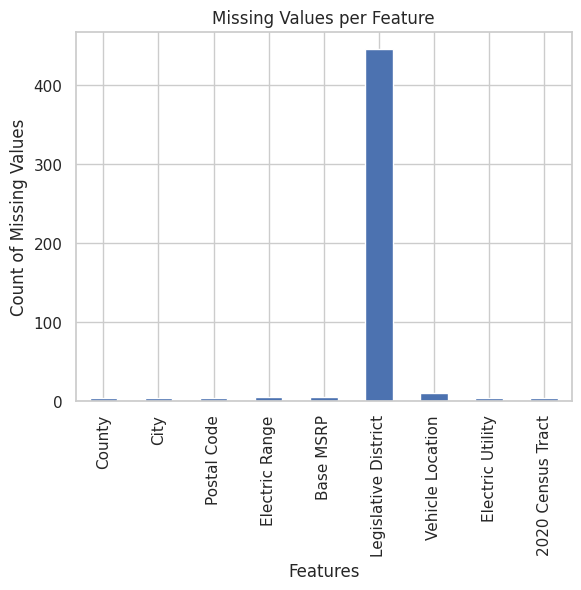

In [85]:
missing_counts = df.isnull().sum()
# Visualize missing data using bar chart
missing_counts[missing_counts > 0].plot(kind='bar')
plt.title("Missing Values per Feature")
plt.xlabel("Features")
plt.ylabel("Count of Missing Values")
plt.show()

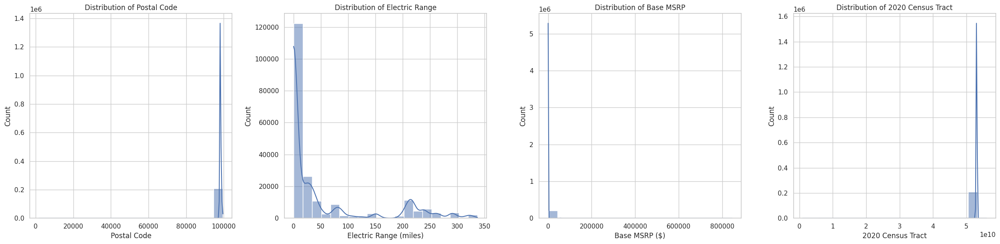

In [86]:
# Create 1x4 grid of subplots
fig, axes = plt.subplots(1, 4, figsize=(24, 6), sharey=False)

# histogram for 'Postal Code'
sns.histplot(df['Postal Code'].dropna(), bins=20, kde=True, ax=axes[0])
axes[0].set_title("Distribution of Postal Code")
axes[0].set_xlabel("Postal Code")

# histogram for 'Electric Range'
sns.histplot(df['Electric Range'].dropna(), bins=20, kde=True, ax=axes[1])
axes[1].set_title("Distribution of Electric Range")
axes[1].set_xlabel("Electric Range (miles)")

# histogram for 'Base MSRP'
sns.histplot(df['Base MSRP'].dropna(), bins=20, kde=True, ax=axes[2])
axes[2].set_title("Distribution of Base MSRP")
axes[2].set_xlabel("Base MSRP ($)")

# histogram for '2020 Census Tract'
sns.histplot(df['2020 Census Tract'].dropna(), bins=20, kde=True, ax=axes[3])
axes[3].set_title("Distribution of 2020 Census Tract")
axes[3].set_xlabel("2020 Census Tract")

plt.tight_layout()
plt.show()

## **2. Handling Missing Value**

In [87]:
# print the shape of the DataFrame before clear data
print(df.shape)
# clear the data with small amount of NaN/none
df.dropna(subset= ['County', 'City', 'Postal Code', 'Electric Range', 'Vehicle Location', 'Electric Utility', '2020 Census Tract'], inplace=True)
print(df.isnull().sum())
# print the shape of the DataFrame after clear data
print(df.shape)

(210165, 17)
VIN (1-10)                                             0
County                                                 0
City                                                   0
State                                                  0
Postal Code                                            0
Model Year                                             0
Make                                                   0
Model                                                  0
Electric Vehicle Type                                  0
Clean Alternative Fuel Vehicle (CAFV) Eligibility      0
Electric Range                                         0
Base MSRP                                              0
Legislative District                                 441
DOL Vehicle ID                                         0
Vehicle Location                                       0
Electric Utility                                       0
2020 Census Tract                                      0
dtype: int64
(2101

In [88]:
# show the number of records with missing value
print(df[df.isnull().any(axis=1)].shape[0])

441


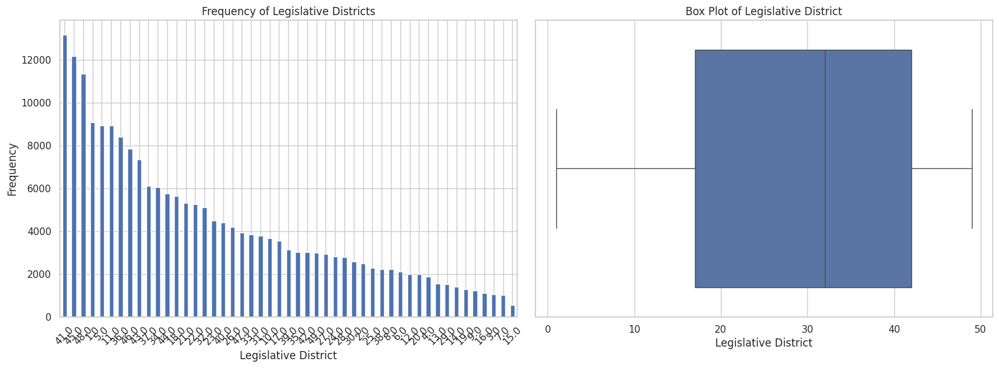

In [89]:

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Bar chart of Legislative District frequencies
district_counts = df['Legislative District'].value_counts()
district_counts.plot(kind='bar', ax=axes[0])
axes[0].set_title('Frequency of Legislative Districts')
axes[0].set_xlabel('Legislative District')
axes[0].set_ylabel('Frequency')
axes[0].tick_params(axis='x', rotation=45)

# Box plot of Legislative District to check for outliers
sns.boxplot(x=df['Legislative District'], ax=axes[1])
axes[1].set_title('Box Plot of Legislative District')
axes[1].set_xlabel('Legislative District')

plt.tight_layout()
plt.show()

In [90]:
# Calculate the mean of the 'Legislative District' column
mean_value = df['Legislative District'].mean()

# Round the mean to the nearest integer
rounded_mean = round(mean_value)

print(rounded_mean)
# Fill missing values (NaN) in the 'Legislative District' column with the rounded mean
df['Legislative District'] = df['Legislative District'].fillna(rounded_mean)

# Check for any remaining missing values
print(df.isnull().sum())


29
VIN (1-10)                                           0
County                                               0
City                                                 0
State                                                0
Postal Code                                          0
Model Year                                           0
Make                                                 0
Model                                                0
Electric Vehicle Type                                0
Clean Alternative Fuel Vehicle (CAFV) Eligibility    0
Electric Range                                       0
Base MSRP                                            0
Legislative District                                 0
DOL Vehicle ID                                       0
Vehicle Location                                     0
Electric Utility                                     0
2020 Census Tract                                    0
dtype: int64


In [91]:
unique_makes = df['Make'].nunique()
print(f'Unique Makes: {unique_makes}')

unique_models = df['Model'].nunique()
print(f'Unique Models: {unique_models}')

Unique Makes: 43
Unique Models: 153


In [92]:
# One-hot encoding for the 'Make' feature
df_encoded = pd.get_dummies(df, columns=['Make'], drop_first=True)

# Display the first few rows of the new DataFrame
df_encoded.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,...,Make_ROLLS-ROYCE,Make_SMART,Make_SUBARU,Make_TESLA,Make_TH!NK,Make_TOYOTA,Make_VINFAST,Make_VOLKSWAGEN,Make_VOLVO,Make_WHEEGO ELECTRIC CARS
0,5UXTA6C0XM,Kitsap,Seabeck,WA,98380.0,2021,X5,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,30.0,...,False,False,False,False,False,False,False,False,False,False
1,5YJ3E1EB1J,Kitsap,Poulsbo,WA,98370.0,2018,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,215.0,...,False,False,False,True,False,False,False,False,False,False
2,WP0AD2A73G,Snohomish,Bothell,WA,98012.0,2016,PANAMERA,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,15.0,...,False,False,False,False,False,False,False,False,False,False
3,5YJ3E1EB5J,Kitsap,Bremerton,WA,98310.0,2018,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,215.0,...,False,False,False,True,False,False,False,False,False,False
4,1N4AZ1CP3K,King,Redmond,WA,98052.0,2019,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,150.0,...,False,False,False,False,False,False,False,False,False,False


In [93]:
# create a copy of the original DataFrame to mainting the original DataFrame
df_copy_corr=df.copy()

# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the categorical feature
df_copy_corr['VIN_encoded'] = label_encoder.fit_transform(df_copy_corr['VIN (1-10)'])
df_copy_corr['County_encoded'] = label_encoder.fit_transform(df_copy_corr['County'])
df_copy_corr['City_encoded'] = label_encoder.fit_transform(df_copy_corr['City'])
df_copy_corr['State_encoded'] = label_encoder.fit_transform(df_copy_corr['State'])
df_copy_corr['Make_encoded'] = label_encoder.fit_transform(df_copy_corr['Make'])
df_copy_corr['Model_encoded'] = label_encoder.fit_transform(df_copy_corr['Model'])
df_copy_corr['Electric Vehicle Type_encoded'] = label_encoder.fit_transform(df_copy_corr['Electric Vehicle Type'])
df_copy_corr['Clean Alternative Fuel Vehicle (CAFV) Eligibility_encoded'] = label_encoder.fit_transform(df_copy_corr['Clean Alternative Fuel Vehicle (CAFV) Eligibility'])
df_copy_corr['Vehicle Location_encoded'] = label_encoder.fit_transform(df_copy_corr['Vehicle Location'])
df_copy_corr['Electric Utility_encoded'] = label_encoder.fit_transform(df_copy_corr['Electric Utility'])


# Drop categorical features
df_copy_corr.drop(['VIN (1-10)'],axis=1,inplace=True)
df_copy_corr.drop(['County'],axis=1,inplace=True)
df_copy_corr.drop(['City'],axis=1,inplace=True)
df_copy_corr.drop(['State'],axis=1,inplace=True)
df_copy_corr.drop(['Make'],axis=1,inplace=True)
df_copy_corr.drop(['Model'],axis=1,inplace=True)
df_copy_corr.drop(['Electric Vehicle Type'],axis=1,inplace=True)
df_copy_corr.drop(['Clean Alternative Fuel Vehicle (CAFV) Eligibility'],axis=1,inplace=True)
df_copy_corr.drop(['Vehicle Location'],axis=1,inplace=True)
df_copy_corr.drop(['Electric Utility'],axis=1,inplace=True)

#df_copy_corr.corr()
df_copy_corr.head()

,Postal Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,2020 Census Tract,VIN_encoded,County_encoded,City_encoded,State_encoded,Make_encoded,Model_encoded,Electric Vehicle Type_encoded,Clean Alternative Fuel Vehicle (CAFV) Eligibility_encoded,Vehicle Location_encoded,Electric Utility_encoded
0,98380.0,2021,30.0,0.0,35.0,267929112,5.303509e+10,3754,87,595,41,5,147,1,0,626,71
1,98370.0,2018,215.0,0.0,23.0,475911439,5.303509e+10,3875,87,524,41,36,88,0,0,575,71
2,98012.0,2016,15.0,0.0,1.0,101971278,5.306105e+10,10664,169,61,41,30,100,1,2,405,71
3,98310.0,2018,215.0,0.0,23.0,474363746,5.303508e+10,3903,87,64,41,36,88,0,0,566,71
4,98052.0,2019,150.0,0.0,45.0,476346482,5.303303e+10,1781,85,546,41,28,86,0,0,375,72


Normalize


In [94]:
# the scaler used
scaler = MinMaxScaler()

# Select the features to normalize
features_to_normalize = ['Postal Code', 'Electric Range', 'Base MSRP', 'Legislative District', 'DOL Vehicle ID',]

# Normalize the selected features
df[features_to_normalize] = scaler.fit_transform(df[features_to_normalize])

df[features_to_normalize].head()

,Postal Code,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID
0,0.987766,0.089021,0.0,0.708333,0.559050
1,0.987664,0.637982,0.0,0.458333,0.993024
2,0.984005,0.044510,0.0,0.000000,0.212763
3,0.987051,0.637982,0.0,0.458333,0.989794
4,0.984414,0.445104,0.0,0.916667,0.993932


# **Step 2: Exploratory Data Analysis:**

In [95]:
# Show the dataFrame info
print(df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 210150 entries, 0 to 210164
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         210150 non-null  object 
 1   County                                             210150 non-null  object 
 2   City                                               210150 non-null  object 
 3   State                                              210150 non-null  object 
 4   Postal Code                                        210150 non-null  float64
 5   Model Year                                         210150 non-null  int64  
 6   Make                                               210150 non-null  object 
 7   Model                                              210150 non-null  object 
 8   Electric Vehicle Type                              210150 non-null  object 
 9 

### **1. Descriptive Statistics: Calculate summary statistics (mean, median, standard deviation) for numerical features.**

In [96]:
numerical_cols = ['Postal Code', 'Model Year', 'Electric Range', 'Base MSRP', 'Legislative District', 'DOL Vehicle ID', '2020 Census Tract']

# get the mean for each numerical column in the DataFrame
Mean = df[numerical_cols].mean()
print(f"Mean values: {Mean.values}\n")

# get the median for each numerical column in the DataFrame
Median = df[numerical_cols].median()
print(f"Median values: {Median.values}\n")

# get the standard deviaton for each column in the DataFrame
STD = df[numerical_cols].std()
print(f"Standard deviation values: {STD.values}\n")

Mean values: [9.85704011e-01 2.02104867e+03 1.50156021e-01 1.06190774e-03
 5.81886252e-01 4.77979998e-01 5.29792909e+10]

Median values: [9.85160354e-01 2.02200000e+03 0.00000000e+00 0.00000000e+00
 6.45833333e-01 5.01849737e-01 5.30330301e+10]

Standard deviation values: [2.49932695e-02 2.98894556e+00 2.58084033e-01 9.05633863e-03
 3.10266068e-01 1.48470324e-01 1.55150699e+09]



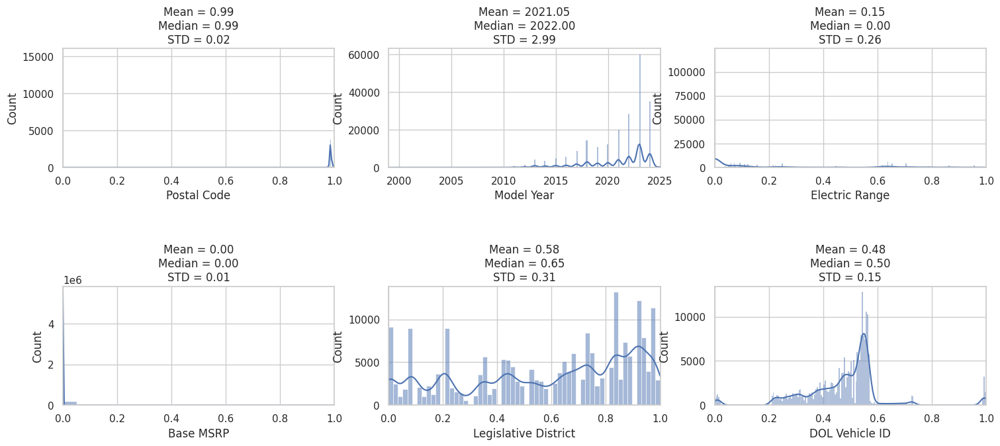

In [97]:
fig, axs = plt.subplots(figsize=(18, 7), ncols=3, nrows=2)

# Iterate over each numerical column and plot histograms with statistics
for i, col in enumerate(numerical_cols[:6]):
    ax = axs[i // 3, i % 3]
    sns.histplot(data=df, x=col, ax=ax, kde=True)
    ax.set_title(
        f"Mean = {Mean[col]:.2f}\n"
        f"Median = {Median[col]:.2f}\n"
        f"STD = {STD[col]:.2f}"
    )
    ax.set_xlim(left=df[col].min(), right=df[col].max())

fig.subplots_adjust(hspace=1.0)
plt.show()

### **2. Spatial Distribution: Visualize the spatial distribution of EVs across locations (e.g., maps).**

In [98]:
!pip install folium

In [99]:
import folium
from folium.plugins import MarkerCluster

# Function to extract coordinates
def extract_coordinates(location):
    try:
        lon, lat = location.split('(')[1].replace(')', '').split()
        return float(lon), float(lat)
    except:
        return None, None

# Apply the extraction function to the 'Vehicle Location' column
df['Longitude'], df['Latitude'] = zip(*df['Vehicle Location'].apply(extract_coordinates))

# Filter out rows with missing coordinates
df_cleaned = df.dropna(subset=['Longitude', 'Latitude'])

# Sample the data to speed up the process
df_sampled = df_cleaned.sample(n=5000, random_state=42)

#color mapping for different vehicle makes
color_mapping = {
    'TESLA': 'red',
    'CHEVROLET': 'blue',
    'NISSAN': 'green',
    'FORD': 'purple',
    'KIA': 'orange',
    'BMW': 'black',
    'TOYOTA': 'pink',
    'HYUNDAI': 'brown',
    'RIVIAN': 'yellow',
    'Other': 'gray'
}

# Initialize a folium map, centered on Washington state
map_center = [47.7511, -120.7401]  # Latitude and Longitude of Washington state
ev_map = folium.Map(location=map_center, zoom_start=7)

# Add a marker cluster for better visualization
marker_cluster = MarkerCluster().add_to(ev_map)

# Add color-coded markers based on the 'Make' column
for index, row in df_sampled.iterrows():
    vehicle_make = row['Make']
    marker_color = color_mapping.get(vehicle_make, 'gray')
    folium.Marker([row['Latitude'], row['Longitude']],
                  popup=f"{row['Make']} {row['Model']} ({row['Model Year']})",
                  icon=folium.Icon(color=marker_color)
                  ).add_to(marker_cluster)

# Display the map
ev_map

<ipython-input-99-426952e94132>:48: UserWarning: color argument of Icon should be one of: {'black', 'gray', 'darkblue', 'pink', 'beige', 'orange', 'lightred', 'purple', 'lightblue', 'lightgreen', 'blue', 'green', 'darkgreen', 'lightgray', 'cadetblue', 'white', 'darkpurple', 'red', 'darkred'}.
  icon=folium.Icon(color=marker_color)


### **3. Model Popularity: Analyze the popularity of different EV models (categorical data) and identify any trends.**

Calculate the frequency of each model then use a bar plot to show the most popular models.

<ipython-input-100-f67627e8526d>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=models, x='Count', y='Model', palette='viridis')


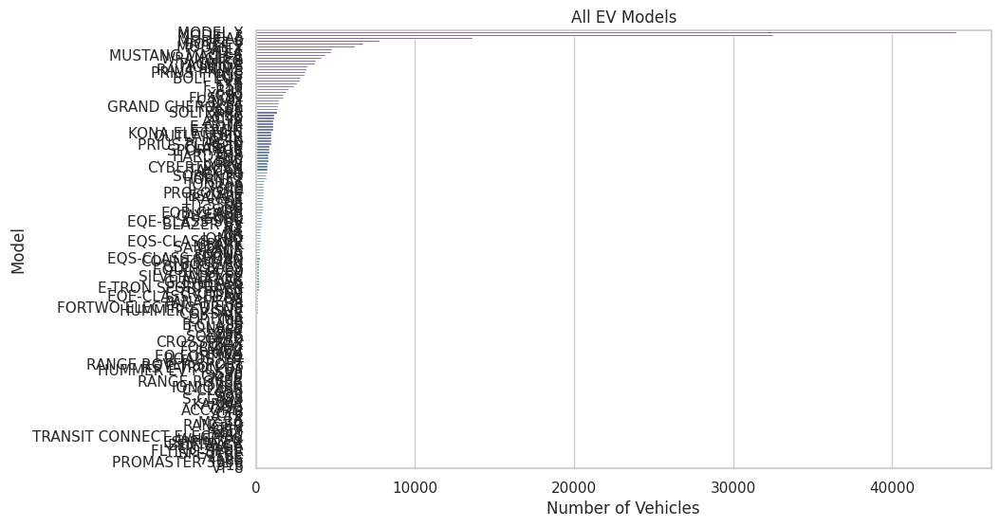

              Model  Count
0           MODEL Y  44037
1           MODEL 3  32519
2              LEAF  13606
3           MODEL S   7795
4           BOLT EV   6779
..              ...    ...
148            750E      2
149           745LE      2
150  PROMASTER 3500      2
151             918      1
152            VF 8      1

[153 rows x 2 columns]


In [100]:
#Calculate the frequency of each model
model_counts = df['Model'].value_counts().reset_index()
model_counts.columns = ['Model', 'Count']
models = model_counts
#Plot the results
plt.figure(figsize=(10, 6))
sns.barplot(data=models, x='Count', y='Model', palette='viridis')
plt.title('All EV Models')
plt.xlabel('Number of Vehicles')
plt.ylabel('Model')
plt.show()

print(models)

<ipython-input-101-ab75fd0d742b>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_models, x='Count', y='Model', color='teal', palette='viridis')


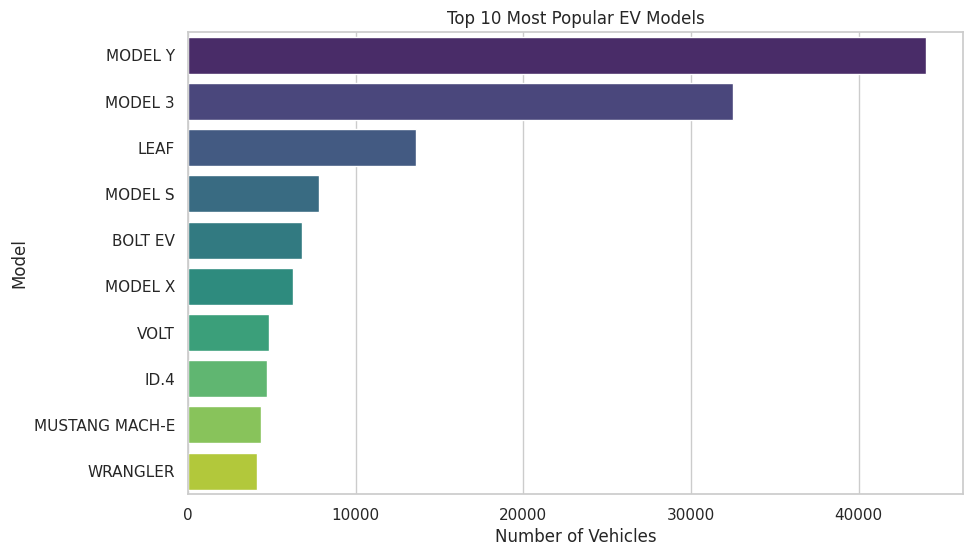

            Model  Count
0         MODEL Y  44037
1         MODEL 3  32519
2            LEAF  13606
3         MODEL S   7795
4         BOLT EV   6779
5         MODEL X   6238
6            VOLT   4814
7            ID.4   4716
8  MUSTANG MACH-E   4363
9        WRANGLER   4115


In [101]:
#Calculate the frequency of each model
model_counts = df['Model'].value_counts().reset_index()
model_counts.columns = ['Model', 'Count']

top_models = model_counts.head(10)
#Plot the results
plt.figure(figsize=(10, 6))
sns.barplot(data=top_models, x='Count', y='Model', color='teal', palette='viridis')
plt.title('Top 10 Most Popular EV Models')
plt.xlabel('Number of Vehicles')
plt.ylabel('Model')
plt.show()

print(top_models)

<ipython-input-102-5e7fbc1e4a3e>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_models, x='Count', y='Make', color='teal', palette='viridis')


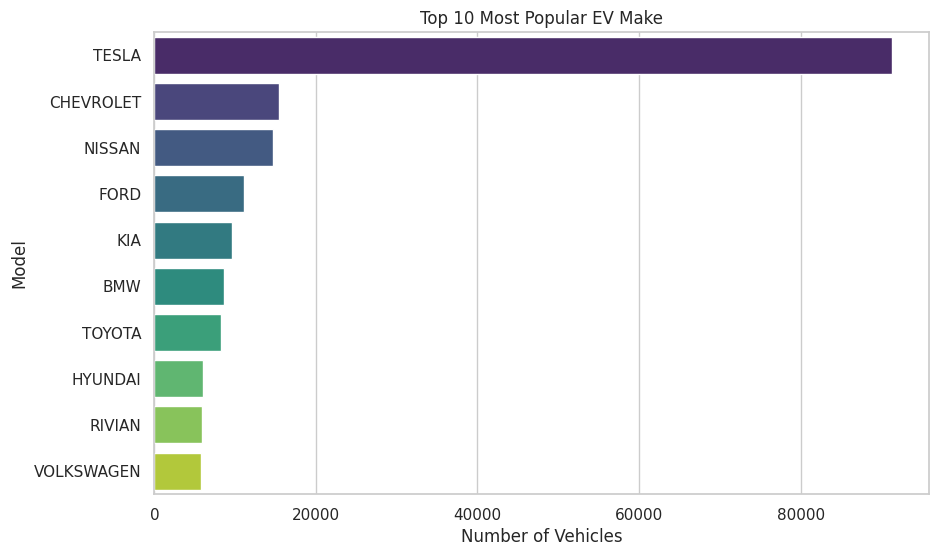

         Make  Count
0       TESLA  91376
1   CHEVROLET  15417
2      NISSAN  14721
3        FORD  11138
4         KIA   9575
5         BMW   8606
6      TOYOTA   8247
7     HYUNDAI   6067
8      RIVIAN   5883
9  VOLKSWAGEN   5783


In [102]:
#Calculate the frequency of each model
model_counts = df['Make'].value_counts().reset_index()
model_counts.columns = ['Make', 'Count']
top_models = model_counts.head(10)

#Plot the results
plt.figure(figsize=(10, 6))
sns.barplot(data=top_models, x='Count', y='Make', color='teal', palette='viridis')
plt.title('Top 10 Most Popular EV Make')
plt.xlabel('Number of Vehicles')
plt.ylabel('Model')
plt.show()
print(top_models)

<ipython-input-103-860ddbc9f313>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_bev_models, x='Count', y='Model', palette='Blues')
<ipython-input-103-860ddbc9f313>:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_phev_models, x='Count', y='Model', palette='Greens')


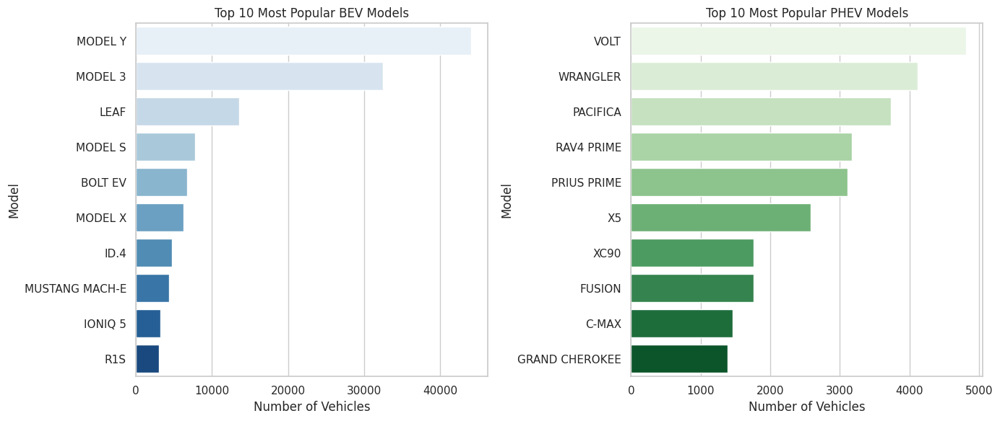

In [103]:
# Filter the dataset by Electric Vehicle Type
bev_data = df[df['Electric Vehicle Type'] == 'Battery Electric Vehicle (BEV)']
phev_data = df[df['Electric Vehicle Type'] == 'Plug-in Hybrid Electric Vehicle (PHEV)']

# Count the frequency of each model for BEV
bev_model_counts = bev_data['Model'].value_counts().reset_index()
bev_model_counts.columns = ['Model', 'Count']
top_bev_models = bev_model_counts.head(10)

# Count the frequency of each model for PHEV
phev_model_counts = phev_data['Model'].value_counts().reset_index()
phev_model_counts.columns = ['Model', 'Count']
top_phev_models = phev_model_counts.head(10)

# Plotting the BEV model popularity
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
sns.barplot(data=top_bev_models, x='Count', y='Model', palette='Blues')
plt.title('Top 10 Most Popular BEV Models')
plt.xlabel('Number of Vehicles')
plt.ylabel('Model')

# Plotting the PHEV model popularity
plt.subplot(1, 2, 2)
sns.barplot(data=top_phev_models, x='Count', y='Model', palette='Greens')
plt.title('Top 10 Most Popular PHEV Models')
plt.xlabel('Number of Vehicles')
plt.ylabel('Model')

plt.tight_layout()
plt.show()

<ipython-input-104-32186c15cd2b>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_bev_makes, x='Count', y='Make', palette='Blues')
<ipython-input-104-32186c15cd2b>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_phev_makes, x='Count', y='Make', palette='Greens')


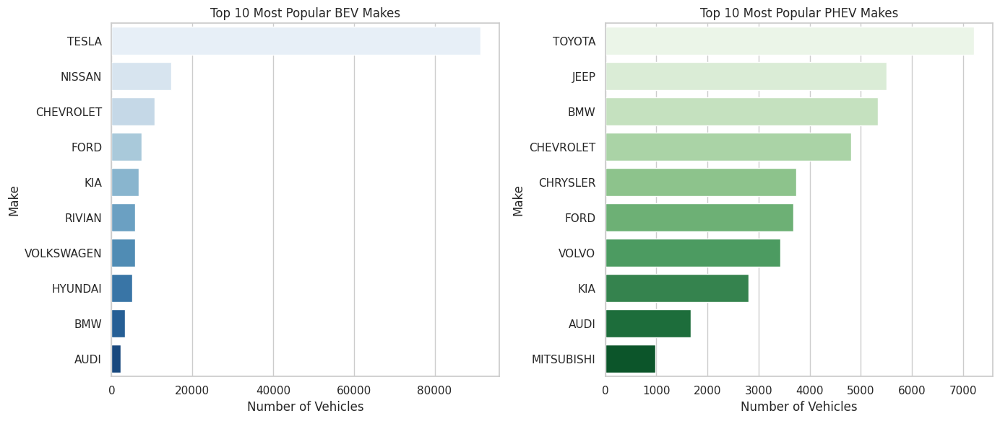

In [104]:
# Filter the dataset by Electric Vehicle Type
bev_data = df[df['Electric Vehicle Type'] == 'Battery Electric Vehicle (BEV)']
phev_data = df[df['Electric Vehicle Type'] == 'Plug-in Hybrid Electric Vehicle (PHEV)']

# Count the frequency of each make for BEV
bev_make_counts = bev_data['Make'].value_counts().reset_index()
bev_make_counts.columns = ['Make', 'Count']
top_bev_makes = bev_make_counts.head(10)

# Count the frequency of each make for PHEV
phev_make_counts = phev_data['Make'].value_counts().reset_index()
phev_make_counts.columns = ['Make', 'Count']
top_phev_makes = phev_make_counts.head(10)

# Plotting the BEV and PHEV make popularity
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
sns.barplot(data=top_bev_makes, x='Count', y='Make', palette='Blues')
plt.title('Top 10 Most Popular BEV Makes')
plt.xlabel('Number of Vehicles')
plt.ylabel('Make')

plt.subplot(1, 2, 2)
sns.barplot(data=top_phev_makes, x='Count', y='Make', palette='Greens')
plt.title('Top 10 Most Popular PHEV Makes')
plt.xlabel('Number of Vehicles')
plt.ylabel('Make')

plt.tight_layout()
plt.show()


### **Investigate the relationship between every pair of numeric features. Are there any correlations? Explain the results.**

In [105]:
numerical_cols = ['Postal Code', 'Model Year', 'Electric Range', 'Base MSRP', 'Legislative District', 'DOL Vehicle ID', '2020 Census Tract']

# Calculate the correlation matrix
correlation_matrix = df[numerical_cols].corr()

print("Correlation Matrix:")
correlation_matrix

Correlation Matrix:


,Postal Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,2020 Census Tract
Postal Code,1.000000,-0.001290,-0.000798,-0.003411,-0.052007,0.005864,0.508744
Model Year,-0.001290,1.000000,-0.513539,-0.230644,-0.016809,0.215702,0.004709
Electric Range,-0.000798,-0.513539,1.000000,0.114177,0.018998,-0.140687,-0.000323
Base MSRP,-0.003411,-0.230644,0.114177,1.000000,0.010470,-0.039482,-0.000284
Legislative District,-0.052007,-0.016809,0.018998,0.010470,1.000000,-0.010721,-0.001244
DOL Vehicle ID,0.005864,0.215702,-0.140687,-0.039482,-0.010721,1.000000,0.003347
2020 Census Tract,0.508744,0.004709,-0.000323,-0.000284,-0.001244,0.003347,1.000000


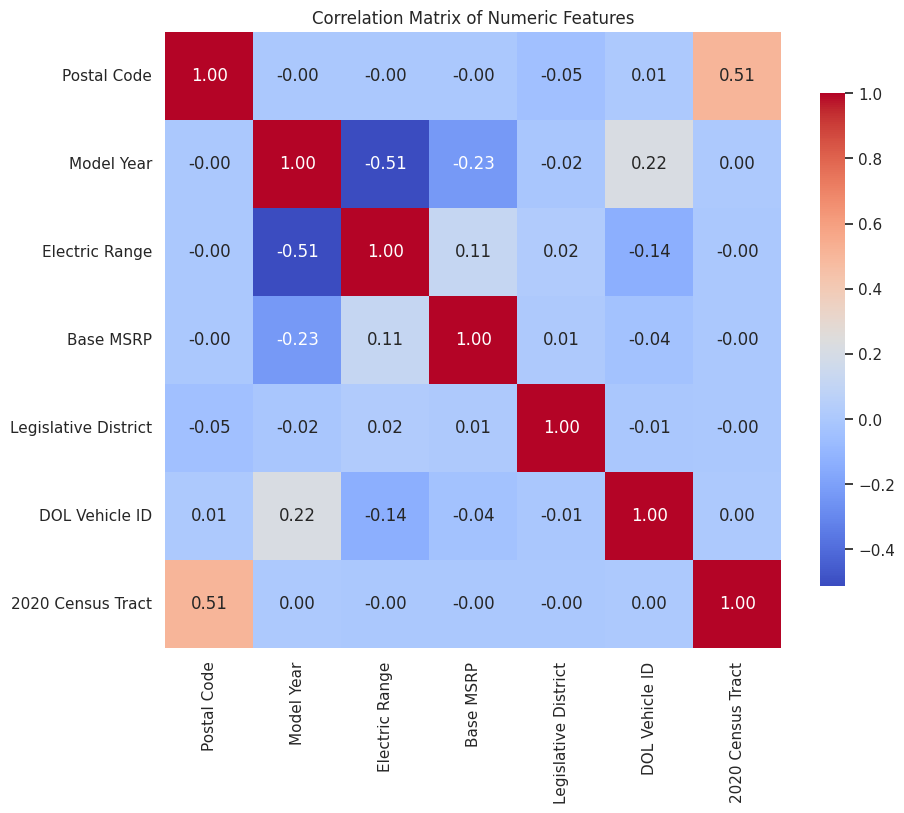

In [106]:
# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True, cbar_kws={'shrink': .8})
plt.title('Correlation Matrix of Numeric Features')
plt.show()

# **Visualization:**
### **Data Exploration Visualizations:**

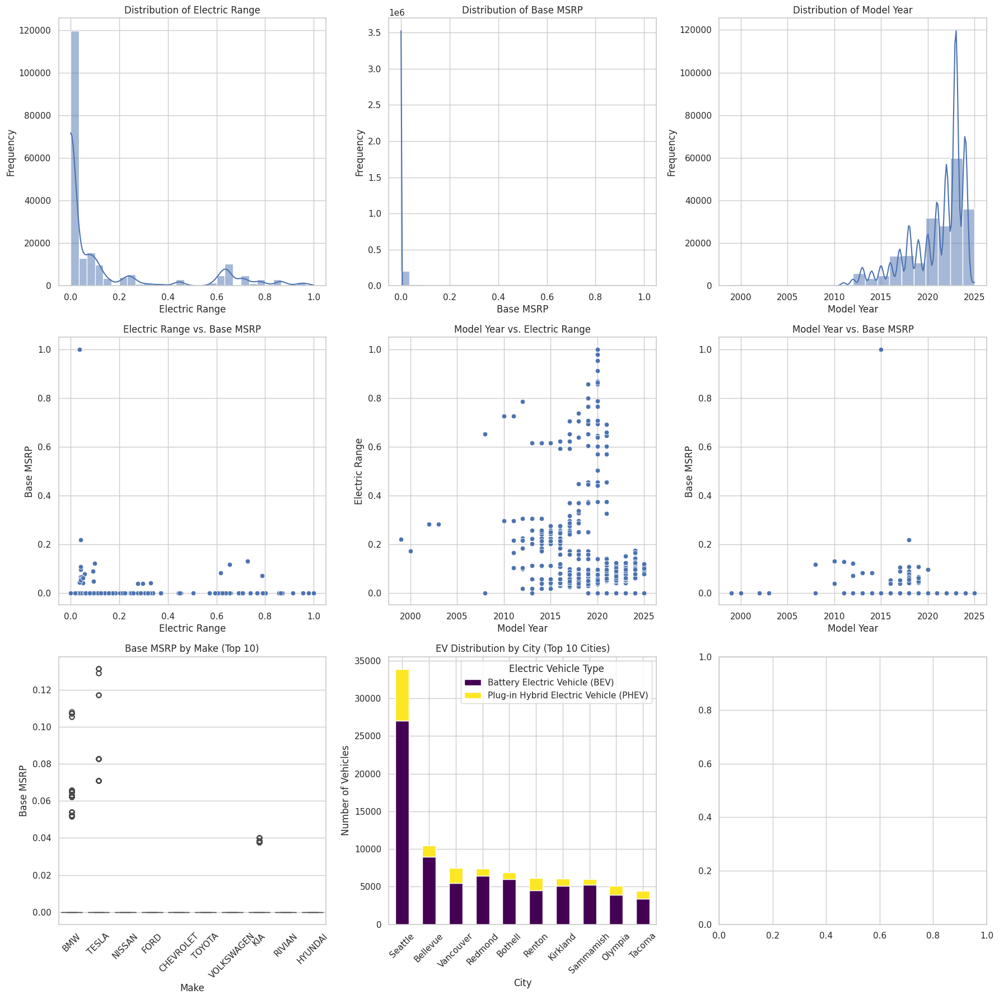

In [107]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 18))

# Set the style for Seaborn
sns.set(style="whitegrid")

# Histograms for 'Electric Range', 'Base MSRP', and 'Model Year'
sns.histplot(df['Electric Range'], bins=30, kde=True, ax=axes[0, 0])
axes[0, 0].set_title("Distribution of Electric Range")
axes[0, 0].set_xlabel("Electric Range")
axes[0, 0].set_ylabel("Frequency")

sns.histplot(df['Base MSRP'], bins=30, kde=True, ax=axes[0, 1])
axes[0, 1].set_title("Distribution of Base MSRP")
axes[0, 1].set_xlabel("Base MSRP")
axes[0, 1].set_ylabel("Frequency")

sns.histplot(df['Model Year'], bins=20, kde=True, ax=axes[0, 2])
axes[0, 2].set_title("Distribution of Model Year")
axes[0, 2].set_xlabel("Model Year")
axes[0, 2].set_ylabel("Frequency")

# Scatter plots to explore relationships between 'Electric Range' and 'Base MSRP' and 'Model Year'
sns.scatterplot(data=df, x='Electric Range', y='Base MSRP', ax=axes[1, 0])
axes[1, 0].set_title("Electric Range vs. Base MSRP")
axes[1, 0].set_xlabel("Electric Range")
axes[1, 0].set_ylabel("Base MSRP")

sns.scatterplot(data=df, x='Model Year', y='Electric Range', ax=axes[1, 1])
axes[1, 1].set_title("Model Year vs. Electric Range")
axes[1, 1].set_xlabel("Model Year")
axes[1, 1].set_ylabel("Electric Range")

sns.scatterplot(data=df, x='Model Year', y='Base MSRP', ax=axes[1, 2])
axes[1, 2].set_title("Model Year vs. Base MSRP")
axes[1, 2].set_xlabel("Model Year")
axes[1, 2].set_ylabel("Base MSRP")

# Boxplots to compare 'Base MSRP' across different 'Make' categories
top_makes = df['Make'].value_counts().nlargest(10).index  # Select top 10 makes
df_top_makes = df[df['Make'].isin(top_makes)]

sns.boxplot(data=df_top_makes, x='Make', y='Base MSRP', ax=axes[2, 0])
axes[2, 0].set_title("Base MSRP by Make (Top 10)")
axes[2, 0].set_xlabel("Make")
axes[2, 0].set_ylabel("Base MSRP")
axes[2, 0].tick_params(axis='x', rotation=45)

# Stacked bar chart for distribution of EV types by city
city_ev_counts = df.groupby(['City', 'Electric Vehicle Type']).size().unstack(fill_value=0)
city_ev_counts = city_ev_counts.loc[city_ev_counts.sum(axis=1).nlargest(10).index]  # Top 10 cities
city_ev_counts.plot(kind='bar', stacked=True, colormap='viridis', ax=axes[2, 1])
axes[2, 1].set_title("EV Distribution by City (Top 10 Cities)")
axes[2, 1].set_xlabel("City")
axes[2, 1].set_ylabel("Number of Vehicles")
axes[2, 1].tick_params(axis='x', rotation=45)

# Adjust layout
plt.tight_layout()
plt.show()


### **Comparative Visualization**

<ipython-input-108-5f09672ffc68>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_counties.values, y=top_counties.index, palette='coolwarm', ax=axs[0])
<ipython-input-108-5f09672ffc68>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_cities.values, y=top_cities.index, palette='crest', ax=axs[1])


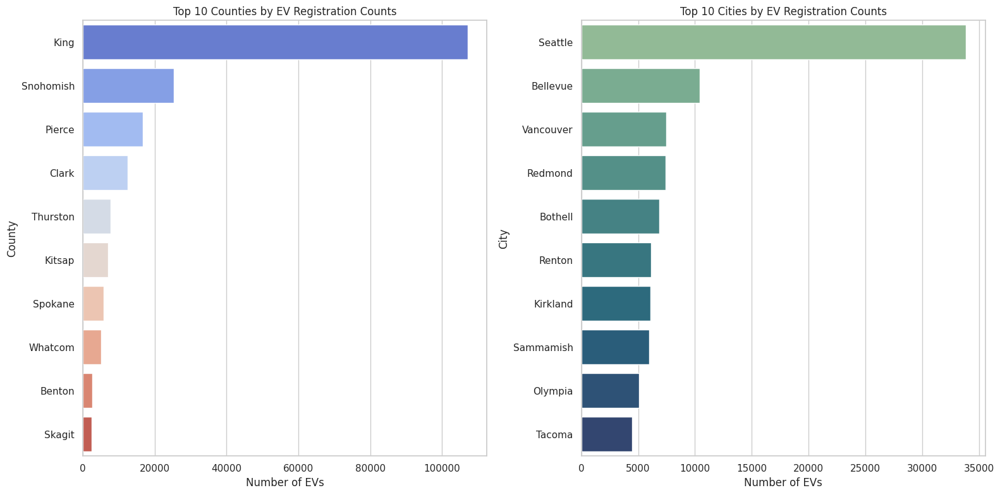

In [108]:
fig, axs = plt.subplots(1, 2, figsize=(16, 8))

top_counties = df['County'].value_counts().head(10)
# Bar plot for top counties
sns.barplot(x=top_counties.values, y=top_counties.index, palette='coolwarm', ax=axs[0])
axs[0].set_title("Top 10 Counties by EV Registration Counts")
axs[0].set_xlabel("Number of EVs")
axs[0].set_ylabel("County")

top_cities = df['City'].value_counts().head(10)
# Bar plot for top cities
sns.barplot(x=top_cities.values, y=top_cities.index, palette='crest', ax=axs[1])
axs[1].set_title("Top 10 Cities by EV Registration Counts")
axs[1].set_xlabel("Number of EVs")
axs[1].set_ylabel("City")

plt.tight_layout()
plt.show()

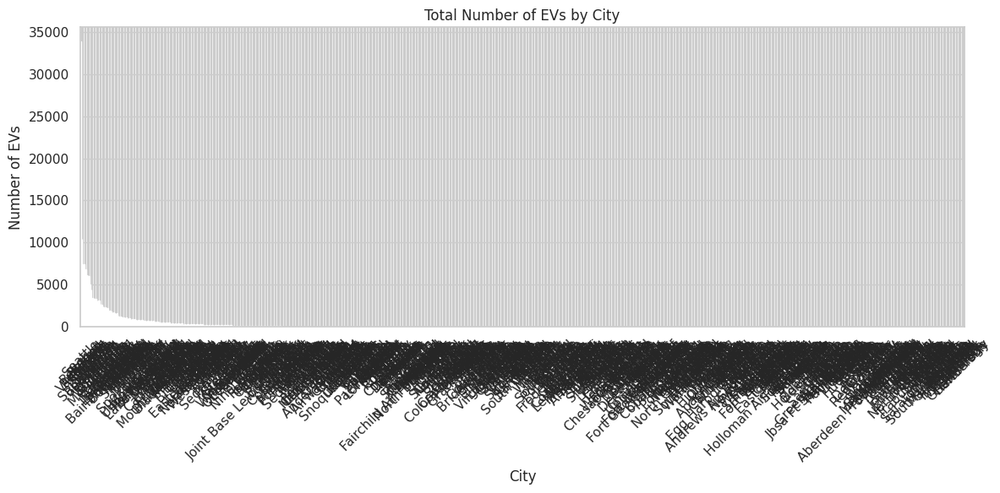

In [109]:
city_counts = df['City'].value_counts()

# Plotting the bar chart
plt.figure(figsize=(12, 6))
city_counts.plot(kind='bar', color='skyblue')
plt.title('Total Number of EVs by City')
plt.xlabel('City')
plt.ylabel('Number of EVs')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

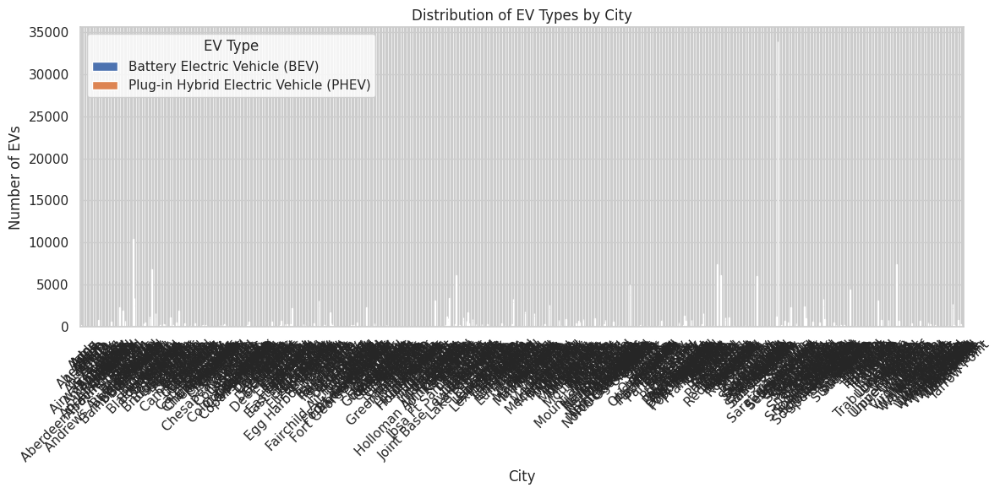

In [110]:
type_distribution = df.groupby(['City', 'Electric Vehicle Type']).size().unstack(fill_value=0)

# Plotting the stacked bar chart
type_distribution.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title('Distribution of EV Types by City')
plt.xlabel('City')
plt.ylabel('Number of EVs')
plt.xticks(rotation=45)
plt.legend(title='EV Type')
plt.tight_layout()
plt.show()


In [111]:
from google.colab import drive
drive.mount('/content/drive')

MessageError: Error: credential propagation was unsuccessful